# 注意事項
* kaggle是Linux環境，有些指令和window系統不同
* 為了節省訓練時間，使用test dataset 當成訓練集
* kaggle中許多更改無法執行在輸入資料，因此先將輸入資料的test dataset新增一份到輸出資料中，再進行更改
* 因原輸入資料的格式，適用於tensorflow object detection API(.xml)，但不適用於YOLO，因此需 

    **1.先將labels和img分開。 img存在data/images；labels暫存在data/labels_xml** 

    **2.將labels的.xml檔轉成YOLO可使用的.txt檔，儲存在data/labels(刪除labels_xml)**

    **3.在data/labels中加入classes.txt檔**

* 建立yaml檔
* epochs >= 300 訓練效果較好

# 下載 YOLOv5 & 安裝套件

In [1]:
# !pip install numpy==1.22.1 scipy==1.7.3
# !pip install --upgrade jupyter-lsp


In [2]:
import os
os.getcwd()

'/kaggle/working'

In [3]:
!git clone https://github.com/ultralytics/yolov5 
!cd yolov5 && pip install -qr requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 15897, done.
remote: Counting objects: 100% (17/17), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 15897 (delta 4), reused 16 (delta 4), pack-reused 15880
Receiving objects: 100% (15897/15897), 14.63 MiB | 25.48 MiB/s, done.
Resolving deltas: 100% (10899/10899), done.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opentelemetry-api 1.18.0 requires importlib-metadata~=6.0.0, but you have importlib-metadata 6.7.0 which is incompatible.
pymc3 3.11.5 requires numpy<1.22.2,>=1.15.0, but you have numpy 1.23.5 which is incompatible.
pymc3 3.11.5 requires scipy<1.8.0,>=1.7.3, but you have scipy 1.11.1 which is incompatible.


# 使用支援GPU的pytorch

In [4]:
# linux
!pip3 install torch torchvision torchaudio

In [5]:
import torch
print(torch.__version__)

2.0.0


# 測試模型

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv

In [7]:
# Model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')

# Image
img = 'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTdEqF6-Ah4rUKh5FrR2WgR2ly5hJfsHi_vmg&usqp=CAU'

# Inference: object detection
results = model(img)

results.pandas().xyxy[0]

/opt/conda/lib/python3.10/site-packages/torch/hub.py:286: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"

,xmin,ymin,xmax,ymax,confidence,class,name
0,56.273232,102.998489,84.074890,171.181702,0.798512,0,person
1,220.382629,131.423752,244.144012,170.002075,0.742680,3,motorcycle
2,76.561852,111.996208,113.177635,156.195969,0.741734,2,car
3,184.610016,115.946541,216.354584,159.589935,0.685948,2,car
4,254.632126,101.135117,272.547577,141.660034,0.662428,0,person
5,216.707413,112.363945,240.349884,165.682831,0.609885,0,person
6,73.432991,101.870964,104.810120,126.248871,0.602262,2,car
7,170.578812,127.903961,193.942856,166.032578,0.593960,3,motorcycle
8,105.408707,103.879974,126.946274,172.994400,0.590289,0,person
9,0.088745,136.022980,20.947699,166.593796,0.585611,1,bicycle


In [8]:
results.print()

image 1/1: 183x276 7 persons, 2 bicycles, 3 cars, 2 motorcycles, 1 bus, 1 handbag
Speed: 77.1ms pre-process, 68.4ms inference, 21.0ms NMS per image at shape (1, 3, 448, 640)


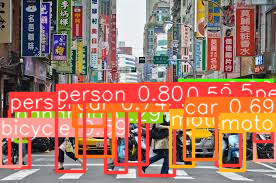

In [9]:
results.show()

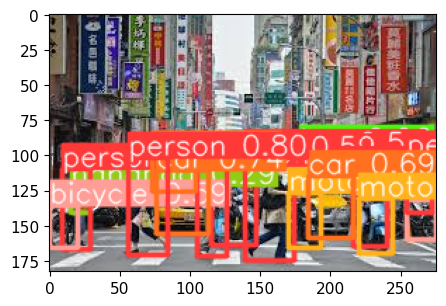

In [10]:
%matplotlib inline
plt.figure(figsize = (5,8))
plt.imshow(np.squeeze(results.render())) # np.squeeze(results.render()).shape
plt.show()

# 將輸入資料拷貝一份到輸出資料
後續更改或呼叫都在輸出資料上

In [11]:
# 指定目录路径
TEST_FOLDER = "/kaggle/input/object-detection-for-ppe-covid19-dataset/dataset/test"
os.mkdir("/kaggle/working/original_data")
!cp -r {TEST_FOLDER} /kaggle/working/original_data

# 切分labels(.xml)和images(.jpg)
且分別要放在data/labels 和 data/images 

In [12]:
os.mkdir("/kaggle/working/data/")
LABELS = "/kaggle/working/data/labels_xml"
IMAGES = "/kaggle/working/data/images"
os.mkdir(LABELS)
os.mkdir(IMAGES)

import os

# 指定目录路径
TEST_FOLDER = "/kaggle/working/original_data/test"

# 遍历目录中的文件
for img_file in os.listdir(TEST_FOLDER):
    if img_file.endswith(".xml"):
        # 使用 os.path.join 连接路径
        xml_path = os.path.join(TEST_FOLDER, img_file)
        # 使用 !cp 命令复制文件，注意使用 $ 符号引用变量
        !cp "$xml_path" "$LABELS"

    if img_file.endswith(".jpg"):
        # 使用 os.path.join 连接路径
        jpg_path = os.path.join(TEST_FOLDER, img_file)
        # 使用 !cp 命令复制文件，注意使用 $ 符号引用变量
        !cp "$jpg_path" "$IMAGES"

# Convert PascalVOC Annotations to YOLO Format
將labels_xml的資料轉為YOLO可使用的.txt檔

In [13]:
import glob
import os
import pickle
import xml.etree.ElementTree as ET
from os import listdir, getcwd
from os.path import join

dirs = ['/kaggle/working/original_data/test']
classes = ["Gloves","Mask","Face_Shield","Coverall", "Goggles"]

def getImagesInDir(dir_path):
    image_list = []
    for filename in glob.glob(dir_path + '/*.jpg'):
        image_list.append(filename)

    return image_list

def convert(size, box):
    dw = 1./(size[0])
    dh = 1./(size[1])
    x = (box[0] + box[1])/2.0 - 1
    y = (box[2] + box[3])/2.0 - 1
    w = box[1] - box[0]
    h = box[3] - box[2]
    x = x*dw
    w = w*dw
    y = y*dh
    h = h*dh
    return (x,y,w,h)

def convert_annotation(dir_path, output_path, image_path):
    basename = os.path.basename(image_path)
    basename_no_ext = os.path.splitext(basename)[0]

    in_file = open(dir_path + '/' + basename_no_ext + '.xml')
    out_file = open(output_path + basename_no_ext + '.txt', 'w')
    tree = ET.parse(in_file)
    root = tree.getroot()
    size = root.find('size')
    w = int(size.find('width').text)
    h = int(size.find('height').text)

    for obj in root.iter('object'):
        difficult = obj.find('difficult').text
        cls = obj.find('name').text
        if cls not in classes or int(difficult)==1:
            continue
        cls_id = classes.index(cls)
        xmlbox = obj.find('bndbox')
        b = (float(xmlbox.find('xmin').text), float(xmlbox.find('xmax').text), float(xmlbox.find('ymin').text), float(xmlbox.find('ymax').text))
        bb = convert((w,h), b)
        out_file.write(str(cls_id) + " " + " ".join([str(a) for a in bb]) + '\n')

# cwd = getcwd()

for dir_path in dirs:
    full_dir_path = dir_path
    output_path =  '/kaggle/working/data/labels/'

    if not os.path.exists(output_path):
        os.makedirs(output_path)

    image_paths = getImagesInDir(full_dir_path)

    for image_path in image_paths:
        convert_annotation(full_dir_path, output_path, image_path)

    print("Finished processing: " + dir_path)

Finished processing: /kaggle/working/original_data/test


In [14]:
# 刪除 labels_xml 暫時存在的folder
import shutil
shutil.rmtree(LABELS)

In [15]:
# txt 中儲存辨識的物件
with open("/kaggle/working/data/labels/ukudtk.txt", "r") as f:
    c = f.read()
print(c)

0 0.6415584415584416 0.7731250000000001 0.2571428571428571 0.43875000000000003
0 0.38506493506493505 0.820625 0.21818181818181817 0.32125
1 0.3691558441558442 0.283125 0.1331168831168831 0.22125
4 0.36883116883116884 0.16125 0.16233766233766234 0.1325
3 0.3568181818181818 0.498125 0.5772727272727273 0.9862500000000001



# Create dataset.yaml

In [16]:
import yaml

# 要写入的特征数据
features = {
    'path':"/kaggle/working/data",
    'train': "images",
    'val': "images",
    'test': None,
    "names":{   
        0:"Gloves",
        1:"Mask",
        2:"Face_Shield",
        3:"Coverall",
        4:"Goggles"
    }
}

# 指定要写入的文件路径
file_path = "/kaggle/working/yolov5/dataset.yaml"

# 将特征数据写入 YAML 文件
with open(file_path, "w") as f:
    yaml.dump(features, f)

print("特征已写入到文件:", file_path)

特征已写入到文件: /kaggle/working/yolov5/dataset.yaml


In [17]:
with open("/kaggle/working/yolov5/dataset.yaml", "r") as f:
    content = f.read()

# 打印读取的内容
print(content)

names:
  0: Gloves
  1: Mask
  2: Face_Shield
  3: Coverall
  4: Goggles
path: /kaggle/working/data
test: null
train: images
val: images



# Create classes.txt

In [18]:
with open("/kaggle/working/data/labels/classes.txt", "w", encoding="utf-8") as f:
    f.write("Gloves\n")
    f.write("Mask\n")
    f.write("Face_Shield\n")
    f.write("Coverall\n")
    f.write("Goggles")

In [19]:
with open("/kaggle/working/data/labels/classes.txt", "r") as f:
    content = f.read()
print(content)

Gloves
Mask
Face_Shield
Coverall
Goggles


# Train Model

In [20]:
# !cd /kaggle/working/yolov5/ && python train.py --img 640 --epochs 5 --data dataset.yaml --weights yolov5s.pt  --batch-size 128 

In [21]:
# !tensorboard --logdir runs/train

In [22]:
!pip install comet_ml 
!export COMET_API_KEY= "ybuE80uYYSjyF6KoLpnEXfooO"  # 2. paste API key
!export COMET_PROJECT_NAME= "yolov5"
!cd /kaggle/working/yolov5/ && python train.py --img 640 --epochs 300 --data dataset.yaml --weights yolov5s.pt  # 3. train

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 558.4/558.4 kB 15.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 73.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.3/54.3 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.1/510.1 kB 33.2 MB/s eta 0:00:00
  Attempting uninstall: websocket-client
    Found existing installation: websocket-client 1.6.0
    Uninstalling websocket-client-1.6.0:
      Successfully uninstalled websocket-client-1.6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jupyterlab-lsp 4.2.0 requires jupyter-lsp>=2.0.0, but you have jupyter-lsp 1.5.1 which is incompatible.
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy versio

# 訓練300回的結果
> Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs

>                   Class     Images  Instances          P          R      mAP50   mAP50-95: 

>                     all         46        338      0.962      0.938      0.977      0.797
>                  Gloves         46        103      0.978      0.981      0.989      0.803
>                    Mask         46         88      0.918      0.943      0.964       0.77
>             Face_Shield         46         26          1      0.765      0.941      0.773
>                Coverall         46         79      0.993          1      0.995      0.901
>                 Goggles         46         42      0.919          1      0.995       0.74

In [23]:
# os.environ['COMET_API_KEY'] = "ybuE80uYYSjyF6KoLpnEXfooO"
# !comet upload /kaggle/working/yolov5/.cometml-runs/bd52d942eeec40c4bf0bbddc0c1e4ebe.zip

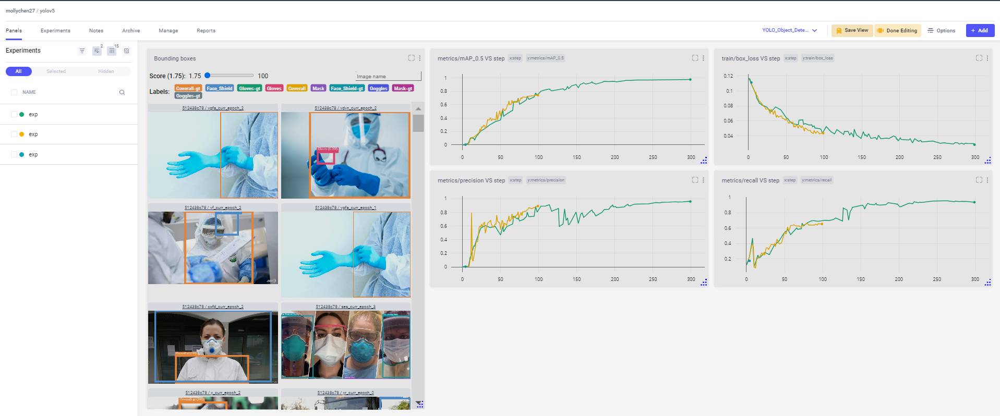

# Load Custom Model

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2023-8-8 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


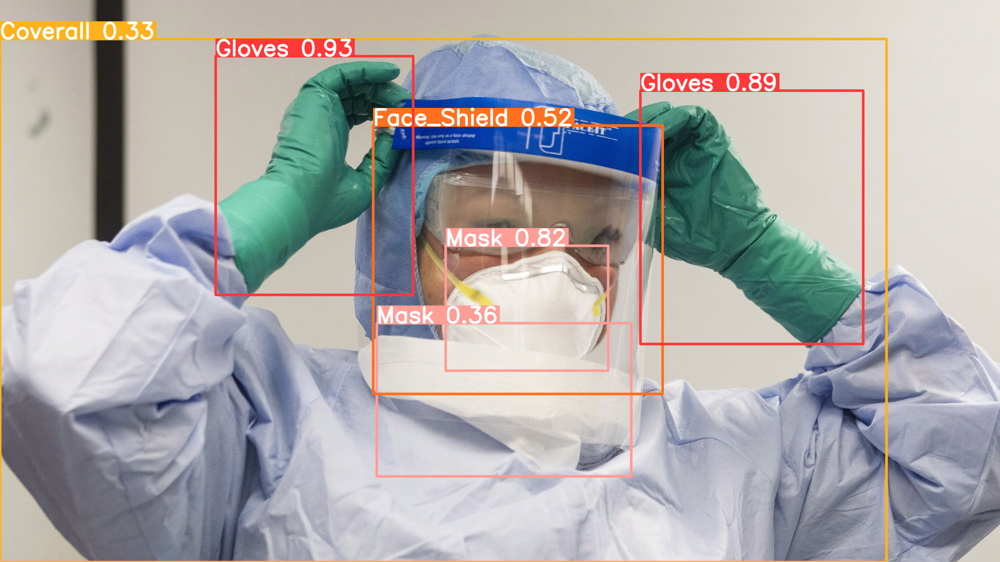

In [24]:
model = torch.hub.load('ultralytics/yolov5', 'custom', path= "/kaggle/working/yolov5/runs/train/exp/weights/last.pt", force_reload = True)
results = model("/kaggle/input/object-detection-for-ppe-covid19-dataset/dataset/train/21fdf.jpg")
results.show()

In [25]:
results.pandas().xyxy[0]

,xmin,ymin,xmax,ymax,confidence,class,name
0,776.178772,202.535110,1487.790161,1062.449585,0.927783,0,Gloves
1,2305.714844,326.853607,3107.838623,1239.065186,0.887293,0,Gloves
2,1604.946655,885.110107,2189.843018,1335.615967,0.819656,1,Mask
3,1343.246338,452.215454,2385.424805,1419.129639,0.516453,2,Face_Shield
4,1356.017578,1164.829102,2272.543457,1716.978882,0.358916,1,Mask
5,0.000000,140.460114,3191.848877,2025.000000,0.325842,3,Coverall
